# 人脸生成（Face Generation）
在该项目中，你将使用生成式对抗网络（Generative Adversarial Nets）来生成新的人脸图像。
### 获取数据
该项目将使用以下数据集：
- MNIST
- CelebA

由于 CelebA 数据集比较复杂，而且这是你第一次使用 GANs。我们想让你先在 MNIST 数据集上测试你的 GANs 模型，以让你更快的评估所建立模型的性能。

如果你在使用 [FloydHub](https://www.floydhub.com/), 请将 `data_dir` 设置为 "/input" 并使用 [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## 探索数据（Explore the Data）
### MNIST
[MNIST](http://yann.lecun.com/exdb/mnist/) 是一个手写数字的图像数据集。你可以更改 `show_n_images` 探索此数据集。

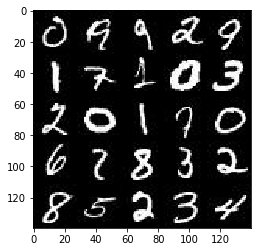

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
[CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) 是一个包含 20 多万张名人图片及相关图片说明的数据集。你将用此数据集生成人脸，不会用不到相关说明。你可以更改 `show_n_images` 探索此数据集。

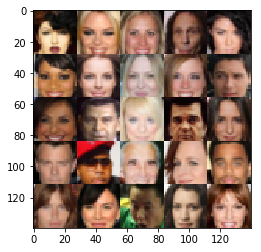

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## 预处理数据（Preprocess the Data）
由于该项目的重点是建立 GANs 模型，我们将为你预处理数据。

经过数据预处理，MNIST 和 CelebA 数据集的值在 28×28 维度图像的 [-0.5, 0.5] 范围内。CelebA 数据集中的图像裁剪了非脸部的图像部分，然后调整到 28x28 维度。

MNIST 数据集中的图像是单[通道](https://en.wikipedia.org/wiki/Channel_(digital_image%29)的黑白图像，CelebA 数据集中的图像是 [三通道的 RGB 彩色图像](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images)。

## 建立神经网络（Build the Neural Network）
你将通过部署以下函数来建立 GANs 的主要组成部分:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### 检查 TensorFlow 版本并获取 GPU 型号
检查你是否使用正确的 TensorFlow 版本，并获取 GPU 型号

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### 输入（Input）
部署 `model_inputs` 函数以创建用于神经网络的 [占位符 (TF Placeholders)](https://www.tensorflow.org/versions/r0.11/api_docs/python/io_ops/placeholders)。请创建以下占位符：
- 输入图像占位符: 使用 `image_width`，`image_height` 和 `image_channels` 设置为 rank 4。
- 输入 Z 占位符: 设置为 rank 2，并命名为 `z_dim`。
- 学习速率占位符: 设置为 rank 0。

返回占位符元组的形状为 (tensor of real input images, tensor of z data, learning rate)。


In [5]:
import problem_unittests as tests
import tensorflow as tf

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, [None,image_width,image_height,image_channels],name = 'input_real')  
    input_z=tf.placeholder(tf.float32,[None, z_dim],name= 'input_z')  
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')  
    keep_prob = tf.placeholder(tf.float32)
    return input_real,input_z,learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### 辨别器（Discriminator）
部署 `discriminator` 函数创建辨别器神经网络以辨别 `images`。该函数应能够重复使用神经网络中的各种变量。 在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "discriminator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回形如 (tensor output of the discriminator, tensor logits of the discriminator) 的元组。

In [6]:
# from tensorflow.contrib.layers import xavier_initializer 

def discriminator(images, reuse=False,alpha=0.2):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):  
        #print(images.shape) 28*28*3  
        x1 = tf.layers.conv2d(images, 32, 5, strides=2, padding='same',
                              kernel_initializer=tf.contrib.layers.xavier_initializer())  
        relu1 = tf.maximum(alpha * x1, x1)  
        x1 = tf.nn.dropout(x1, keep_prob=0.8)
  
        x2 = tf.layers.conv2d(relu1, 64, 5, strides=2, padding='same',
                              kernel_initializer=tf.contrib.layers.xavier_initializer())  
        bn2 = tf.layers.batch_normalization(x2, training=True)  
        relu2 = tf.maximum(alpha*bn2, bn2)  
        x2 = tf.nn.dropout(x2, keep_prob=0.8)
  
        x3 = tf.layers.conv2d(relu2, 128, 5, strides=2, padding='same',
                              kernel_initializer=tf.contrib.layers.xavier_initializer())  
        bn3 = tf.layers.batch_normalization(x3, training=True)  
        relu3 = tf.maximum(alpha*bn3, bn3)  
        x3 = tf.nn.dropout(x3, keep_prob=0.8)
  
        flat = tf.reshape(relu3, (-1, 4*4*128))  
        
        logits = tf.layers.dense(flat, 1)  
        out = tf.sigmoid(logits)  
        return out, logits 

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### 生成器（Generator）
部署 `generator` 函数以使用 `z` 生成图像。该函数应能够重复使用神经网络中的各种变量。
在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "generator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回所生成的 28 x 28 x `out_channel_dim` 维度图像。

In [7]:
def generator(z, out_channel_dim, is_train=True,alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse = not is_train):  
        # First fully connected layer  
        x1 = tf.layers.dense(z, 3*3*512)  
          
        # Reshape it to start the convolutional stack  
        x1 = tf.reshape(x1, (-1, 3, 3, 512))  
        x1 = tf.layers.batch_normalization(x1, training= is_train)  
        x1 = tf.maximum(alpha * x1, x1)  
#         x1 = tf.nn.dropout(x1, keep_prob=0.8) 
        #print(x1.shape)  
        # 3x3x512 now  
          
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same',
                              kernel_initializer=tf.contrib.layers.xavier_initializer())  
        x2 = tf.layers.batch_normalization(x2, training= is_train)  
        x2 = tf.maximum(alpha * x2, x2) 
#         x2 = tf.nn.dropout(x2, keep_prob=0.8)
        #print(x2.shape)  
        # 6x6x256 now，卷积核大小设为5*5  
          
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same',
                              kernel_initializer=tf.contrib.layers.xavier_initializer())  
        x3 = tf.layers.batch_normalization(x3, training=is_train)  
        x3 = tf.maximum(alpha * x3, x3)  
#         x3 = tf.nn.dropout(x3, keep_prob=0.8)
        #print(x3.shape)  
        # 12x12x128 now  
          
        # Output layer  
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 6, strides=2, padding='valid',
                                           kernel_initializer=tf.contrib.layers.xavier_initializer())  
        #print(logits.shape)  
        # 28x28x5now  
          
        out = tf.tanh(logits)  
          
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### 损失函数（Loss）
部署 `model_loss` 函数训练并计算 GANs 的损失。该函数应返回形如 (discriminator loss, generator loss) 的元组。

使用你已实现的函数：
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim,alpha=0.2,smooth=0.1):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim,alpha=alpha)  
    d_model_real, d_logits_real = discriminator(input_real,alpha=alpha)  
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True,alpha=alpha)
    
    
    d_loss_real = tf.reduce_mean(  
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_logits_real)* (1- smooth)))
    d_loss_fake = tf.reduce_mean(  
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))  
    g_loss = tf.reduce_mean(  
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))  
    d_loss = d_loss_real + d_loss_fake  
      
    return d_loss, g_loss  


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### 优化（Optimization）
部署 `model_opt` 函数实现对 GANs 的优化。使用 [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) 获取可训练的所有变量。通过变量空间名 `discriminator` 和 `generator` 来过滤变量。该函数应返回形如 (discriminator training operation, generator training operation) 的元组。

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    t_vars = tf.trainable_variables()  
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]  
    g_vars = [var for var in t_vars if var.name.startswith('generator')]  
      
    # Optimize  
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):  
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)  
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)  
      
    return d_train_opt, g_train_opt 


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## 训练神经网络（Neural Network Training）
### 输出显示
使用该函数可以显示生成器 (Generator) 在训练过程中的当前输出，这会帮你评估 GANs 模型的训练程度。

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### 训练
部署 `train` 函数以建立并训练 GANs 模型。记得使用以下你已完成的函数：
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

使用 `show_generator_output` 函数显示 `generator` 在训练过程中的输出。

**注意**：在每个批次 (batch) 中运行 `show_generator_output` 函数会显著增加训练时间与该 notebook 的体积。推荐每 100 批次输出一次 `generator` 的输出。 

In [17]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    _, img_width, img_height, img_channels = data_shape  
      
    input_real, input_z, lr = model_inputs(img_width, img_height, img_channels, z_dim)  
      
    d_loss, g_loss = model_loss(input_real, input_z, img_channels)  
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)  
    
      
    steps = 0  
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                batch_images *= 2
                # TODO: Train Model
                steps += 1  
                  
                # Sample random noise for G  
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))  
                  
                # Run optimizers  
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z,lr:learning_rate})  
                _ = sess.run(g_opt, feed_dict={input_real: batch_images,input_z: batch_z,lr:learning_rate })  
                if steps % 100 == 0:  
                    # At the end of each epoch, get the losses and print them out  
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})  
                    train_loss_g = g_loss.eval({input_z: batch_z})  
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),  
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),  
                          "Generator Loss: {:.4f}".format(train_loss_g))  
                    show_generator_output(sess, 30, input_z, img_channels, data_image_mode)  
                
                

### MNIST
在 MNIST 上测试你的 GANs 模型。经过 2 次迭代，GANs 应该能够生成类似手写数字的图像。确保生成器 (generator) 低于辨别器 (discriminator) 的损失，或接近 0。

Epoch 1/2... Discriminator Loss: 1.5618... Generator Loss: 0.5810


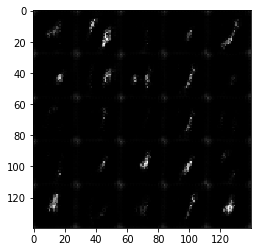

Epoch 1/2... Discriminator Loss: 1.1032... Generator Loss: 1.2781


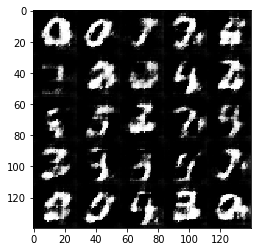

Epoch 1/2... Discriminator Loss: 1.3863... Generator Loss: 0.7777


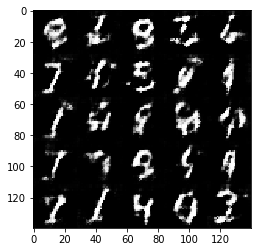

Epoch 1/2... Discriminator Loss: 1.1774... Generator Loss: 1.0219


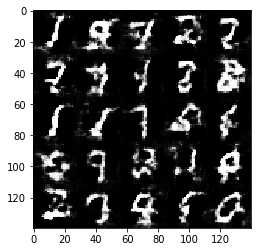

Epoch 1/2... Discriminator Loss: 1.1721... Generator Loss: 0.8844


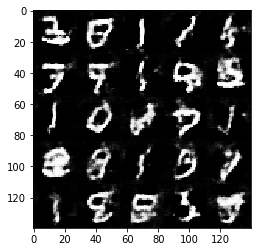

Epoch 1/2... Discriminator Loss: 1.2312... Generator Loss: 0.7945


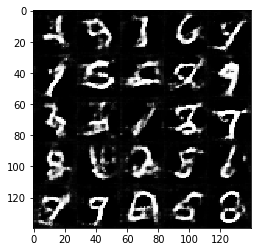

Epoch 1/2... Discriminator Loss: 1.1017... Generator Loss: 0.8306


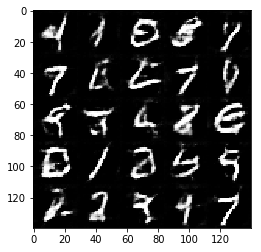

Epoch 1/2... Discriminator Loss: 1.1823... Generator Loss: 1.0471


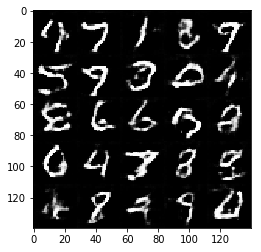

Epoch 1/2... Discriminator Loss: 2.0469... Generator Loss: 2.5179


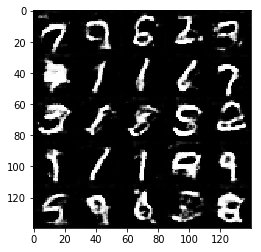

Epoch 1/2... Discriminator Loss: 1.2225... Generator Loss: 1.1142


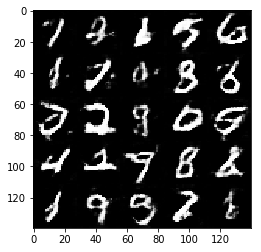

Epoch 1/2... Discriminator Loss: 1.1073... Generator Loss: 0.8944


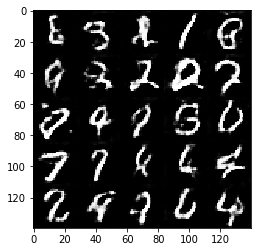

Epoch 1/2... Discriminator Loss: 0.8275... Generator Loss: 1.3073


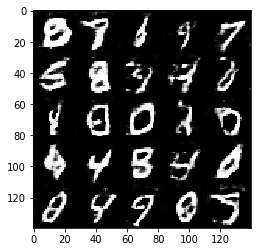

Epoch 1/2... Discriminator Loss: 1.6504... Generator Loss: 2.8371


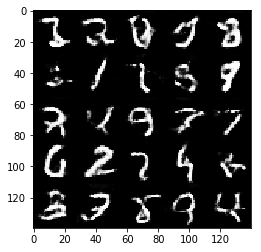

Epoch 1/2... Discriminator Loss: 1.1121... Generator Loss: 0.7443


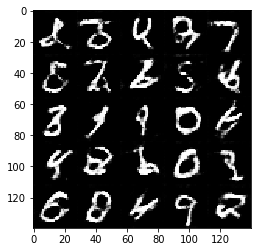

Epoch 1/2... Discriminator Loss: 0.8544... Generator Loss: 1.9093


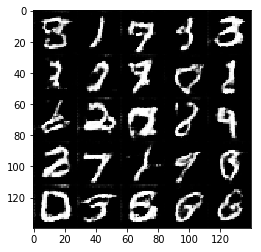

Epoch 1/2... Discriminator Loss: 1.0071... Generator Loss: 0.9000


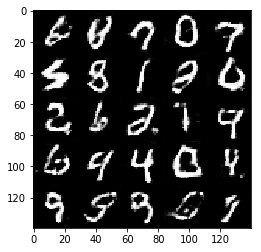

Epoch 1/2... Discriminator Loss: 1.0807... Generator Loss: 1.2984


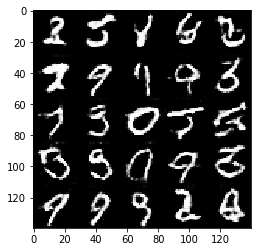

Epoch 1/2... Discriminator Loss: 1.6016... Generator Loss: 0.6573


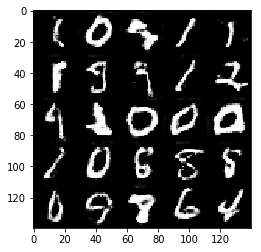

Epoch 2/2... Discriminator Loss: 0.9245... Generator Loss: 0.9770


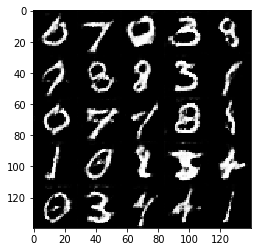

Epoch 2/2... Discriminator Loss: 0.6883... Generator Loss: 1.3998


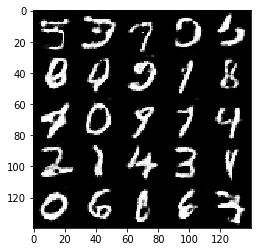

Epoch 2/2... Discriminator Loss: 1.4259... Generator Loss: 0.6828


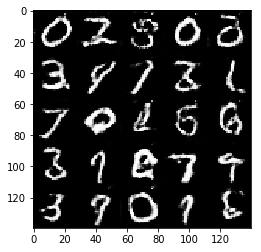

Epoch 2/2... Discriminator Loss: 1.1517... Generator Loss: 0.6773


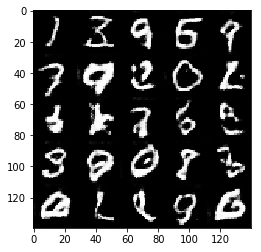

Epoch 2/2... Discriminator Loss: 0.4802... Generator Loss: 2.2454


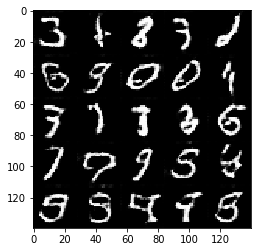

Epoch 2/2... Discriminator Loss: 1.2988... Generator Loss: 0.6363


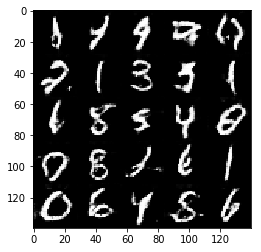

Epoch 2/2... Discriminator Loss: 0.6746... Generator Loss: 1.5133


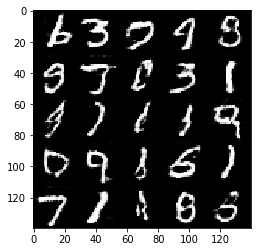

Epoch 2/2... Discriminator Loss: 1.3924... Generator Loss: 3.4157


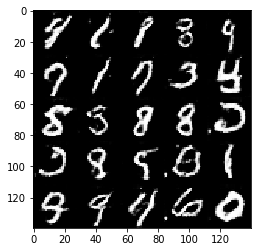

Epoch 2/2... Discriminator Loss: 0.6670... Generator Loss: 1.8095


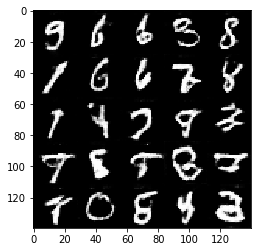

Epoch 2/2... Discriminator Loss: 0.6026... Generator Loss: 2.3862


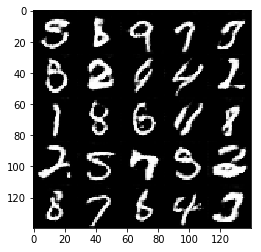

Epoch 2/2... Discriminator Loss: 0.7251... Generator Loss: 1.3401


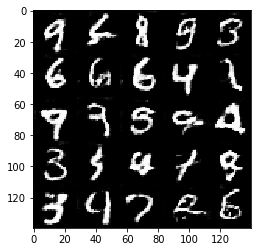

Epoch 2/2... Discriminator Loss: 0.5615... Generator Loss: 2.1140


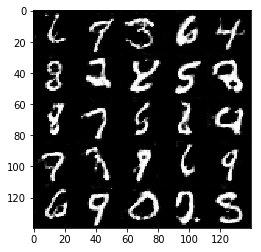

Epoch 2/2... Discriminator Loss: 0.8887... Generator Loss: 1.0519


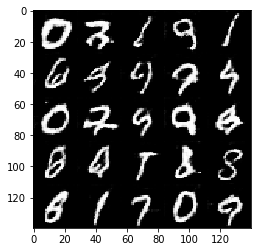

Epoch 2/2... Discriminator Loss: 0.6585... Generator Loss: 1.5510


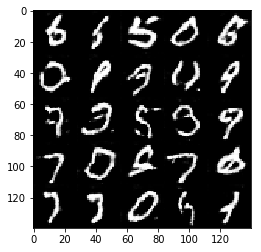

Epoch 2/2... Discriminator Loss: 0.9373... Generator Loss: 1.0229


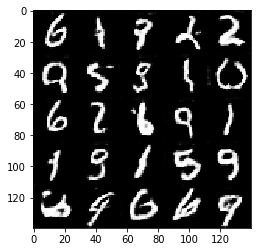

Epoch 2/2... Discriminator Loss: 1.1735... Generator Loss: 3.7678


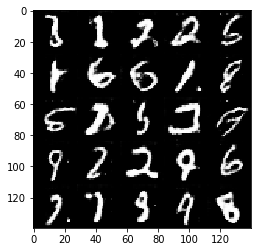

Epoch 2/2... Discriminator Loss: 0.9572... Generator Loss: 0.9969


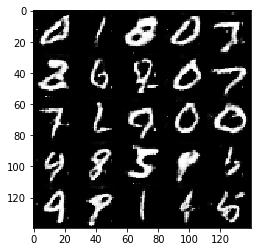

Epoch 2/2... Discriminator Loss: 1.0527... Generator Loss: 0.8443


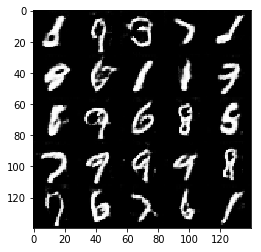

Epoch 2/2... Discriminator Loss: 1.0755... Generator Loss: 0.8919


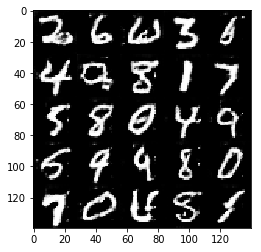

In [18]:
batch_size = 32
z_dim = 100
learning_rate = 0.001
beta1 = 0.4


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
在 CelebA 上运行你的 GANs 模型。在一般的GPU上运行每次迭代大约需要 20 分钟。你可以运行整个迭代，或者当 GANs 开始产生真实人脸图像时停止它。

Epoch 1/1... Discriminator Loss: 1.2239... Generator Loss: 0.7558


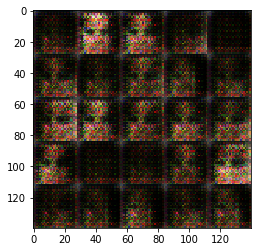

Epoch 1/1... Discriminator Loss: 1.0296... Generator Loss: 1.1962


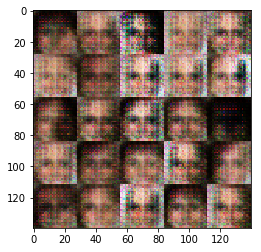

Epoch 1/1... Discriminator Loss: 0.9884... Generator Loss: 1.4321


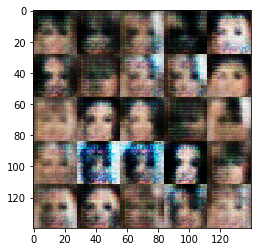

Epoch 1/1... Discriminator Loss: 1.5209... Generator Loss: 0.7008


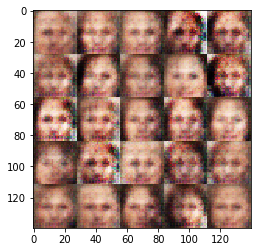

Epoch 1/1... Discriminator Loss: 1.5732... Generator Loss: 0.5293


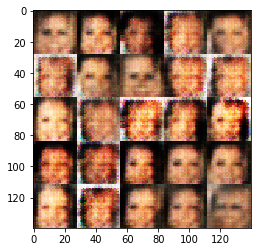

Epoch 1/1... Discriminator Loss: 1.2914... Generator Loss: 0.6970


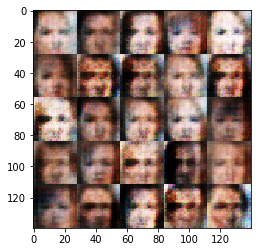

Epoch 1/1... Discriminator Loss: 1.1830... Generator Loss: 0.9160


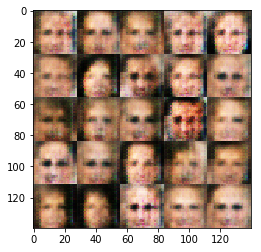

Epoch 1/1... Discriminator Loss: 1.6291... Generator Loss: 0.8237


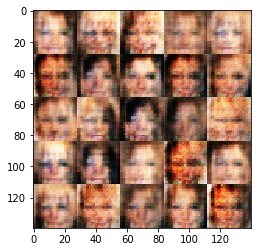

Epoch 1/1... Discriminator Loss: 1.4364... Generator Loss: 1.3433


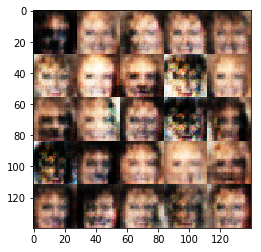

Epoch 1/1... Discriminator Loss: 1.3417... Generator Loss: 0.9511


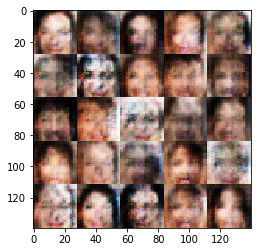

Epoch 1/1... Discriminator Loss: 1.3189... Generator Loss: 0.8827


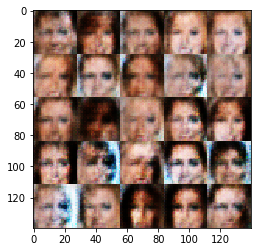

Epoch 1/1... Discriminator Loss: 1.4995... Generator Loss: 0.5756


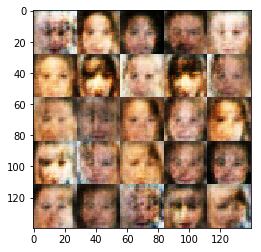

Epoch 1/1... Discriminator Loss: 1.3129... Generator Loss: 0.7462


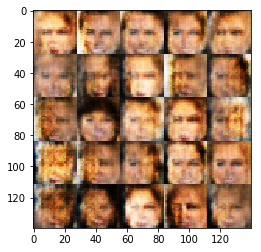

Epoch 1/1... Discriminator Loss: 1.3031... Generator Loss: 0.7458


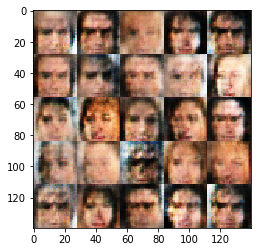

Epoch 1/1... Discriminator Loss: 1.2954... Generator Loss: 0.8614


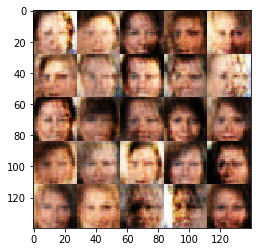

Epoch 1/1... Discriminator Loss: 1.6000... Generator Loss: 0.5196


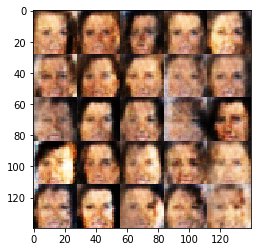

Epoch 1/1... Discriminator Loss: 1.0349... Generator Loss: 0.9647


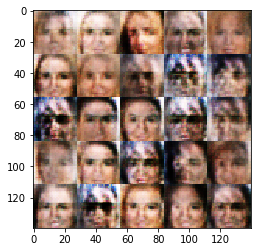

Epoch 1/1... Discriminator Loss: 1.2448... Generator Loss: 0.8152


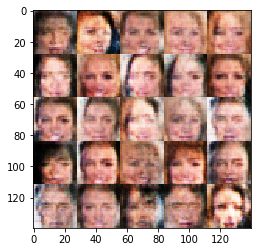

Epoch 1/1... Discriminator Loss: 1.5277... Generator Loss: 0.5034


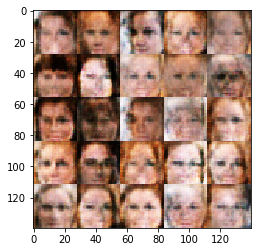

Epoch 1/1... Discriminator Loss: 1.3002... Generator Loss: 0.6484


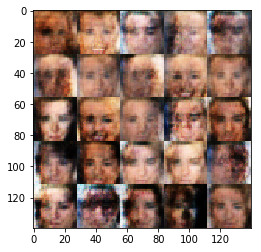

Epoch 1/1... Discriminator Loss: 1.3299... Generator Loss: 0.9621


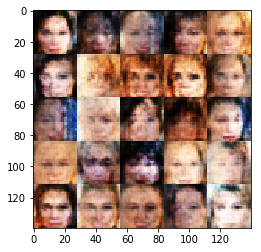

Epoch 1/1... Discriminator Loss: 1.2880... Generator Loss: 0.8120


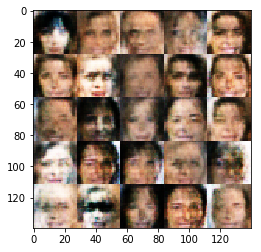

Epoch 1/1... Discriminator Loss: 1.1800... Generator Loss: 0.9599


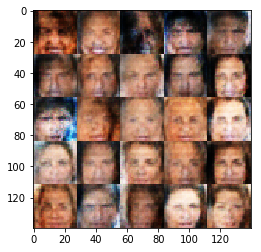

Epoch 1/1... Discriminator Loss: 1.3740... Generator Loss: 0.5868


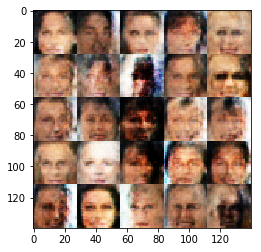

Epoch 1/1... Discriminator Loss: 1.2901... Generator Loss: 0.8805


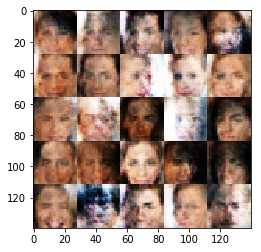

Epoch 1/1... Discriminator Loss: 1.5965... Generator Loss: 0.4031


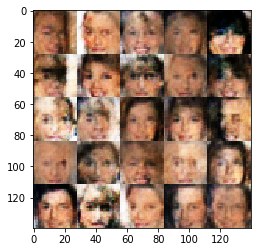

Epoch 1/1... Discriminator Loss: 1.3350... Generator Loss: 0.7130


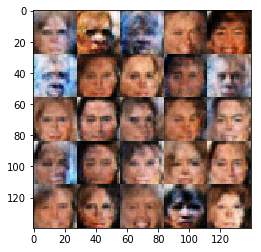

Epoch 1/1... Discriminator Loss: 1.5105... Generator Loss: 0.5350


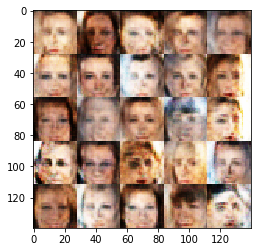

Epoch 1/1... Discriminator Loss: 1.4019... Generator Loss: 0.5355


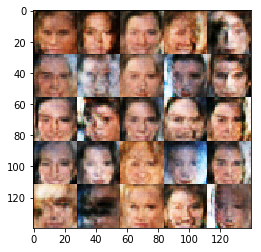

Epoch 1/1... Discriminator Loss: 1.3784... Generator Loss: 0.5782


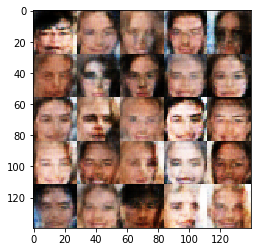

Epoch 1/1... Discriminator Loss: 1.1643... Generator Loss: 0.9619


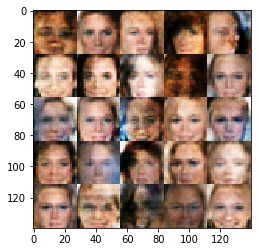

Epoch 1/1... Discriminator Loss: 1.5549... Generator Loss: 0.4433


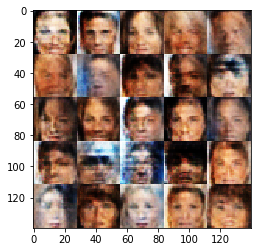

Epoch 1/1... Discriminator Loss: 0.9902... Generator Loss: 1.1865


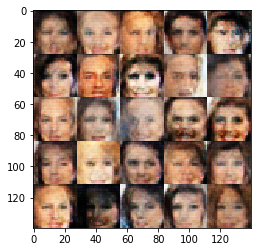

Epoch 1/1... Discriminator Loss: 1.5590... Generator Loss: 0.3997


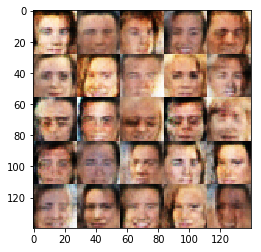

Epoch 1/1... Discriminator Loss: 1.3797... Generator Loss: 0.5646


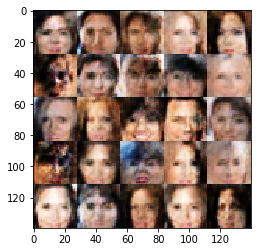

Epoch 1/1... Discriminator Loss: 1.1891... Generator Loss: 0.7969


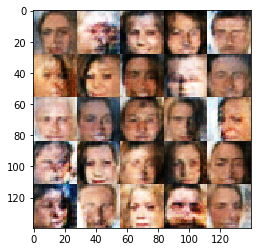

Epoch 1/1... Discriminator Loss: 1.1901... Generator Loss: 0.7195


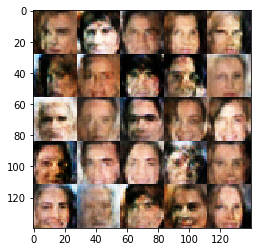

Epoch 1/1... Discriminator Loss: 1.0777... Generator Loss: 1.1083


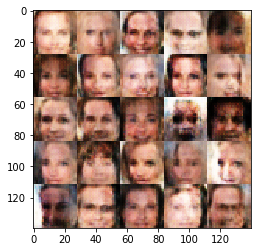

Epoch 1/1... Discriminator Loss: 1.3118... Generator Loss: 0.6643


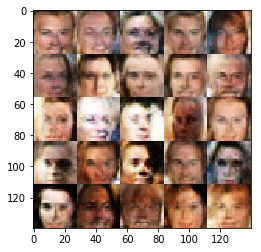

Epoch 1/1... Discriminator Loss: 1.3383... Generator Loss: 0.5286


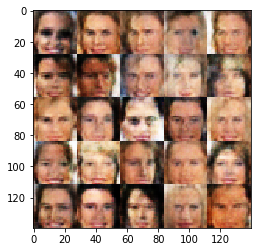

Epoch 1/1... Discriminator Loss: 1.2980... Generator Loss: 0.8085


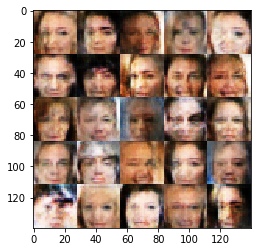

Epoch 1/1... Discriminator Loss: 1.1124... Generator Loss: 1.0591


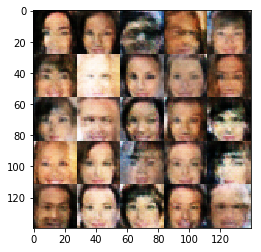

Epoch 1/1... Discriminator Loss: 1.6073... Generator Loss: 0.4316


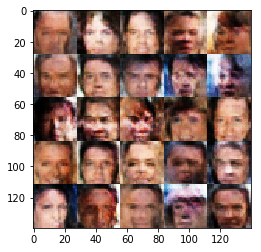

Epoch 1/1... Discriminator Loss: 1.1857... Generator Loss: 0.6511


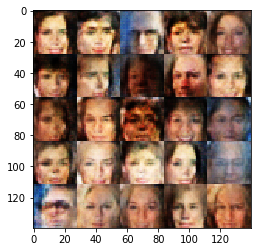

Epoch 1/1... Discriminator Loss: 1.3517... Generator Loss: 0.5369


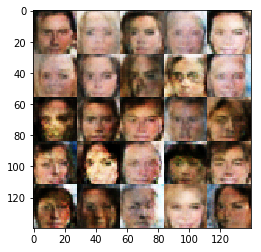

Epoch 1/1... Discriminator Loss: 1.0272... Generator Loss: 0.9971


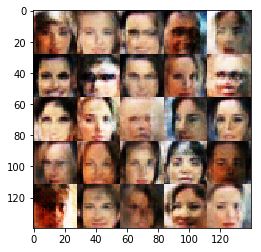

Epoch 1/1... Discriminator Loss: 1.1254... Generator Loss: 0.8715


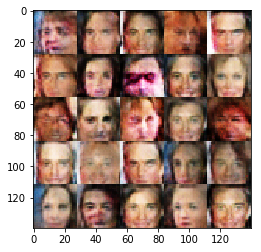

Epoch 1/1... Discriminator Loss: 1.3545... Generator Loss: 0.6549


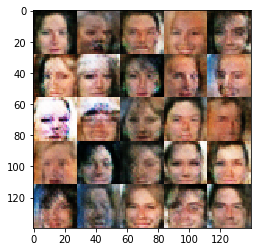

Epoch 1/1... Discriminator Loss: 1.3637... Generator Loss: 0.6431


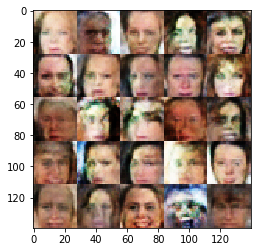

Epoch 1/1... Discriminator Loss: 1.0842... Generator Loss: 1.1708


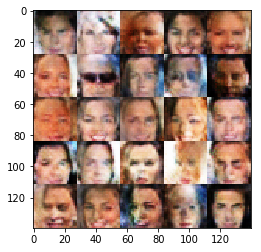

Epoch 1/1... Discriminator Loss: 1.3633... Generator Loss: 0.7100


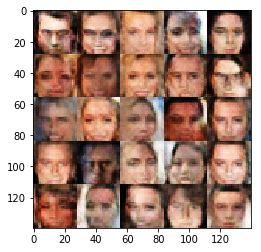

Epoch 1/1... Discriminator Loss: 1.2907... Generator Loss: 0.7642


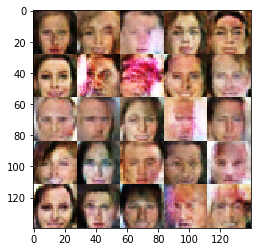

Epoch 1/1... Discriminator Loss: 1.2283... Generator Loss: 1.2148


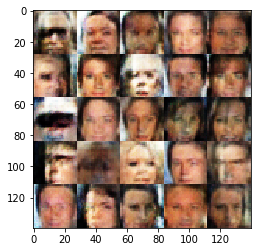

Epoch 1/1... Discriminator Loss: 1.3092... Generator Loss: 0.5266


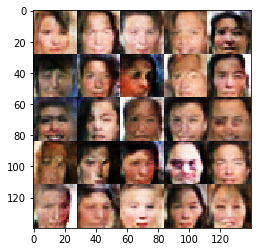

Epoch 1/1... Discriminator Loss: 1.2996... Generator Loss: 0.8270


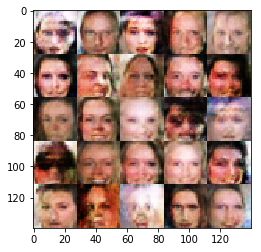

Epoch 1/1... Discriminator Loss: 1.2448... Generator Loss: 0.6341


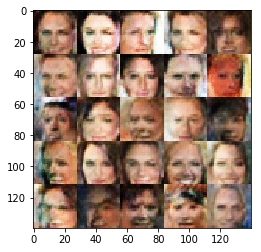

Epoch 1/1... Discriminator Loss: 1.2319... Generator Loss: 0.7219


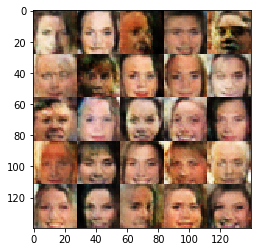

Epoch 1/1... Discriminator Loss: 1.3200... Generator Loss: 0.5980


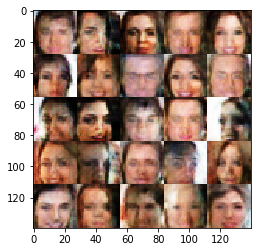

Epoch 1/1... Discriminator Loss: 0.9074... Generator Loss: 1.1489


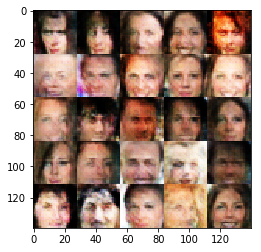

Epoch 1/1... Discriminator Loss: 1.3740... Generator Loss: 0.5616


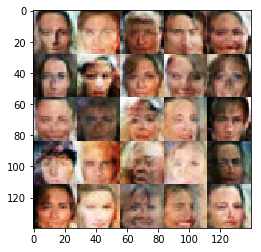

Epoch 1/1... Discriminator Loss: 1.4672... Generator Loss: 0.4624


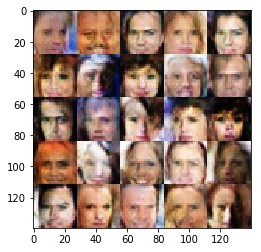

Epoch 1/1... Discriminator Loss: 1.1675... Generator Loss: 0.8916


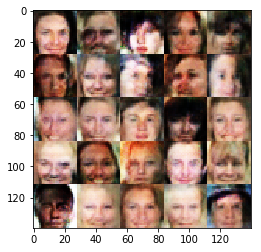

Epoch 1/1... Discriminator Loss: 1.0395... Generator Loss: 1.5322


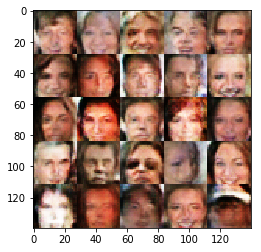

Epoch 1/1... Discriminator Loss: 1.1815... Generator Loss: 0.9371


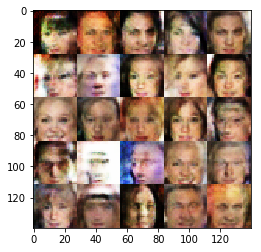

Epoch 1/1... Discriminator Loss: 1.4134... Generator Loss: 0.5403


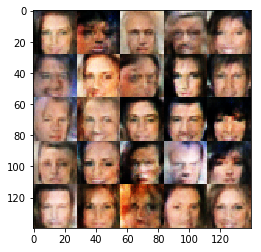

Epoch 1/1... Discriminator Loss: 1.2311... Generator Loss: 0.6449


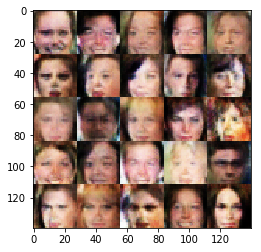

Epoch 1/1... Discriminator Loss: 1.6408... Generator Loss: 0.4090


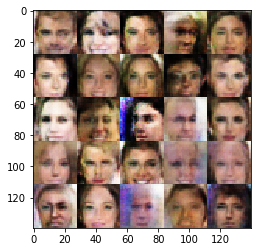

Epoch 1/1... Discriminator Loss: 1.2312... Generator Loss: 0.6534


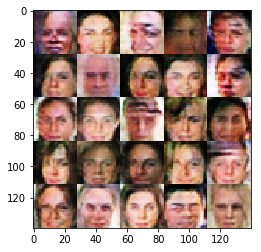

Epoch 1/1... Discriminator Loss: 1.1351... Generator Loss: 0.8329


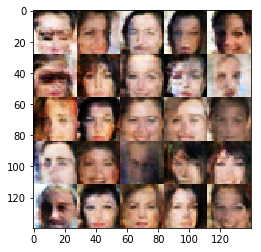

Epoch 1/1... Discriminator Loss: 1.2633... Generator Loss: 0.7910


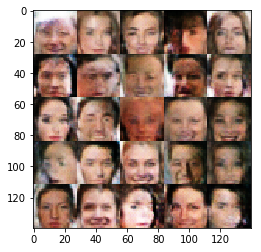

Epoch 1/1... Discriminator Loss: 1.1698... Generator Loss: 0.8250


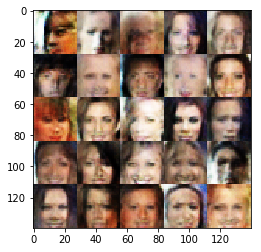

Epoch 1/1... Discriminator Loss: 1.0947... Generator Loss: 1.1204


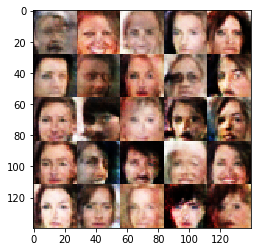

Epoch 1/1... Discriminator Loss: 1.2541... Generator Loss: 0.7083


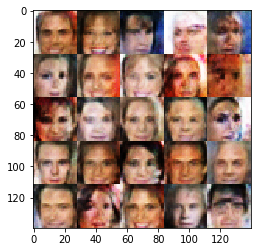

Epoch 1/1... Discriminator Loss: 1.4144... Generator Loss: 0.5777


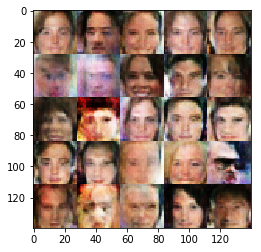

Epoch 1/1... Discriminator Loss: 1.2777... Generator Loss: 0.5469


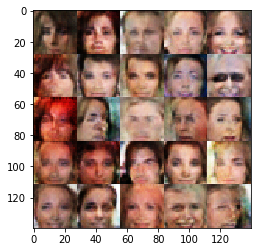

Epoch 1/1... Discriminator Loss: 1.2394... Generator Loss: 0.8256


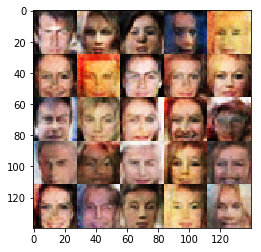

Epoch 1/1... Discriminator Loss: 1.0123... Generator Loss: 0.9936


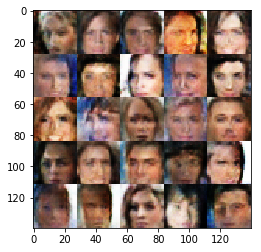

Epoch 1/1... Discriminator Loss: 1.2398... Generator Loss: 0.6965


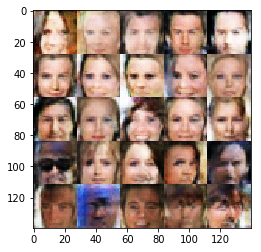

Epoch 1/1... Discriminator Loss: 1.0962... Generator Loss: 0.8852


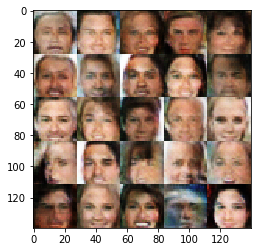

Epoch 1/1... Discriminator Loss: 1.1196... Generator Loss: 0.8441


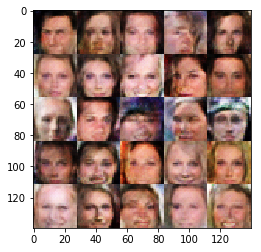

Epoch 1/1... Discriminator Loss: 1.5615... Generator Loss: 0.3999


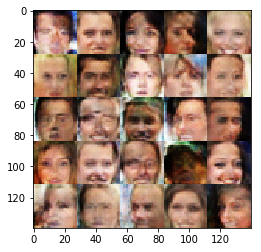

Epoch 1/1... Discriminator Loss: 1.0874... Generator Loss: 1.5530


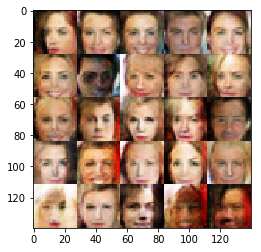

Epoch 1/1... Discriminator Loss: 1.1627... Generator Loss: 1.0484


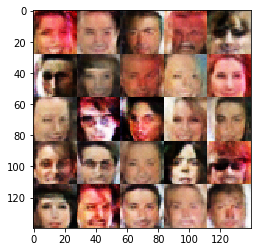

Epoch 1/1... Discriminator Loss: 1.6735... Generator Loss: 0.3253


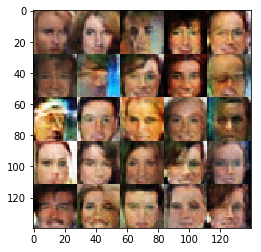

Epoch 1/1... Discriminator Loss: 1.3650... Generator Loss: 0.5240


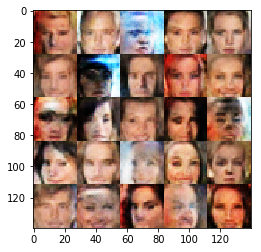

Epoch 1/1... Discriminator Loss: 0.9795... Generator Loss: 0.8884


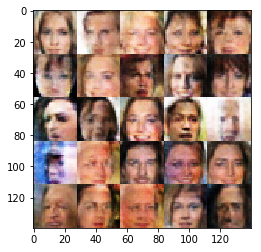

Epoch 1/1... Discriminator Loss: 1.7044... Generator Loss: 0.3287


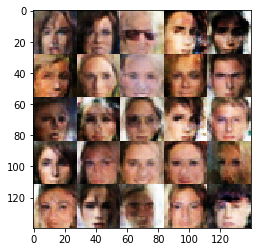

Epoch 1/1... Discriminator Loss: 1.2058... Generator Loss: 0.7198


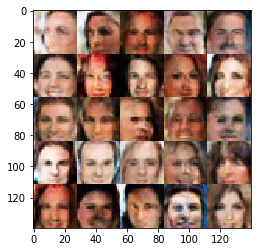

Epoch 1/1... Discriminator Loss: 1.4480... Generator Loss: 0.5118


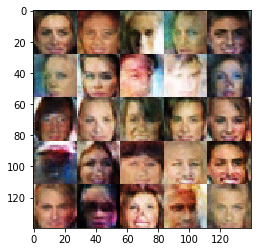

Epoch 1/1... Discriminator Loss: 1.3322... Generator Loss: 0.7198


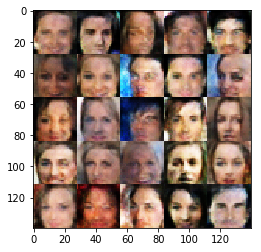

Epoch 1/1... Discriminator Loss: 1.5252... Generator Loss: 0.5152


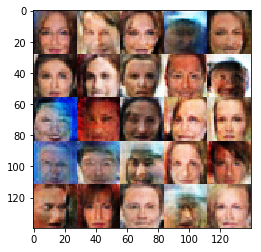

Epoch 1/1... Discriminator Loss: 1.4535... Generator Loss: 1.1602


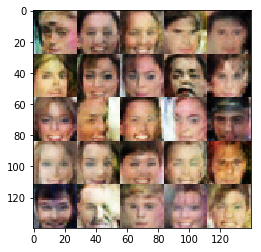

Epoch 1/1... Discriminator Loss: 1.3417... Generator Loss: 0.6128


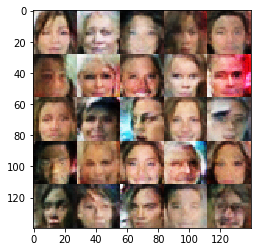

Epoch 1/1... Discriminator Loss: 1.3163... Generator Loss: 0.6643


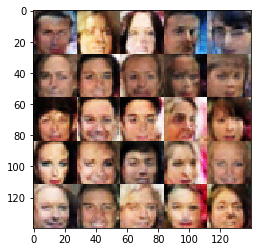

Epoch 1/1... Discriminator Loss: 1.4615... Generator Loss: 0.5801


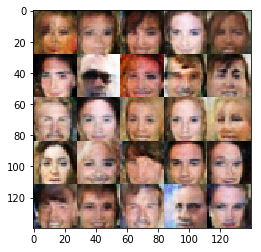

Epoch 1/1... Discriminator Loss: 1.4866... Generator Loss: 0.6510


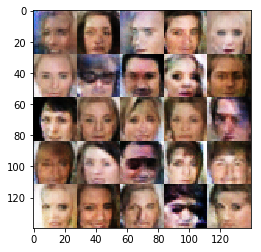

Epoch 1/1... Discriminator Loss: 1.4013... Generator Loss: 0.5669


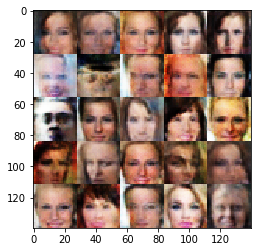

Epoch 1/1... Discriminator Loss: 1.1025... Generator Loss: 0.9964


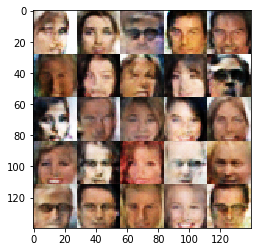

Epoch 1/1... Discriminator Loss: 1.3968... Generator Loss: 0.5793


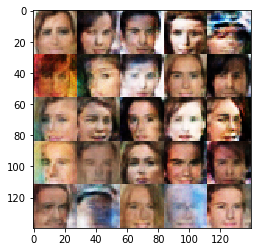

Epoch 1/1... Discriminator Loss: 1.4052... Generator Loss: 0.6232


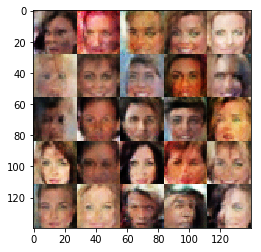

Epoch 1/1... Discriminator Loss: 1.4708... Generator Loss: 0.7202


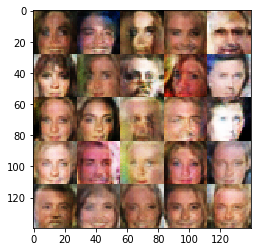

Epoch 1/1... Discriminator Loss: 0.9819... Generator Loss: 1.1288


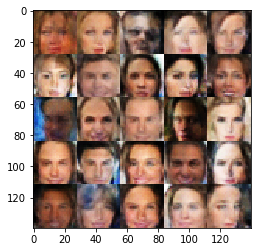

Epoch 1/1... Discriminator Loss: 1.3968... Generator Loss: 0.5352


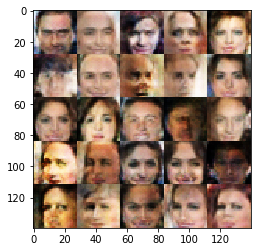

Epoch 1/1... Discriminator Loss: 0.9698... Generator Loss: 1.0181


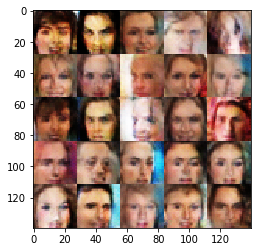

Epoch 1/1... Discriminator Loss: 1.3847... Generator Loss: 0.6403


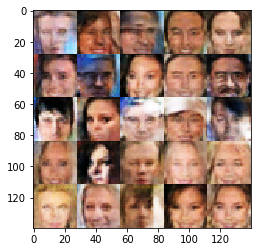

Epoch 1/1... Discriminator Loss: 1.2825... Generator Loss: 0.6686


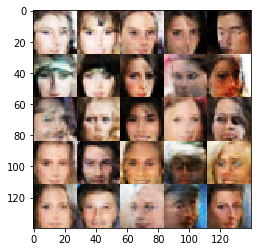

Epoch 1/1... Discriminator Loss: 1.2806... Generator Loss: 0.5892


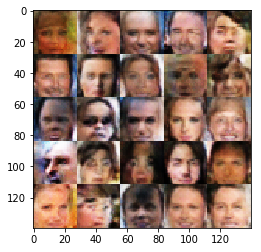

Epoch 1/1... Discriminator Loss: 1.1004... Generator Loss: 1.2186


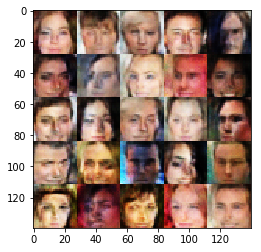

Epoch 1/1... Discriminator Loss: 1.3243... Generator Loss: 0.5833


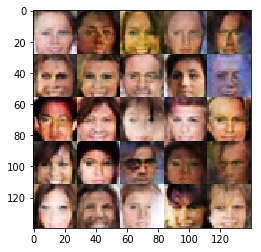

Epoch 1/1... Discriminator Loss: 1.0003... Generator Loss: 0.8467


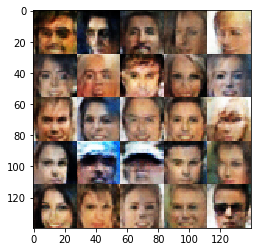

Epoch 1/1... Discriminator Loss: 1.1409... Generator Loss: 0.7932


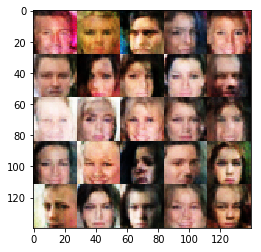

Epoch 1/1... Discriminator Loss: 1.2265... Generator Loss: 0.9213


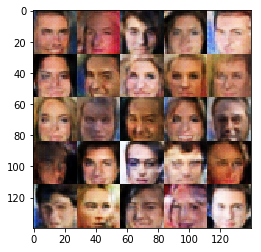

Epoch 1/1... Discriminator Loss: 1.1691... Generator Loss: 0.8590


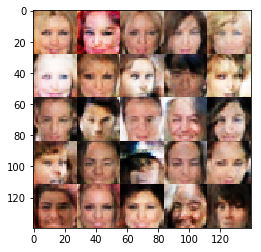

Epoch 1/1... Discriminator Loss: 1.4403... Generator Loss: 0.4960


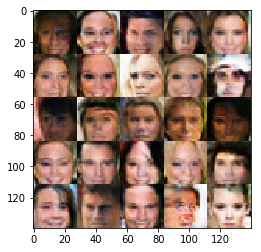

Epoch 1/1... Discriminator Loss: 1.1324... Generator Loss: 0.8013


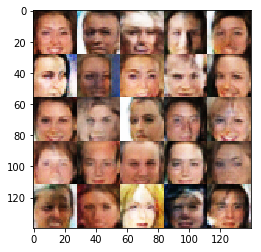

Epoch 1/1... Discriminator Loss: 1.2185... Generator Loss: 0.7692


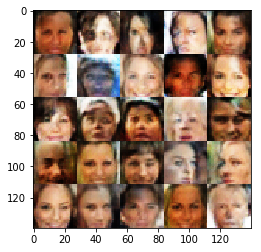

Epoch 1/1... Discriminator Loss: 1.1890... Generator Loss: 0.8627


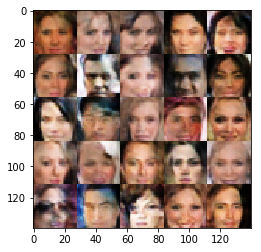

Epoch 1/1... Discriminator Loss: 1.3178... Generator Loss: 0.8546


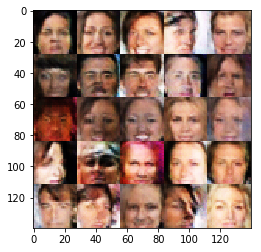

Epoch 1/1... Discriminator Loss: 1.2895... Generator Loss: 0.5658


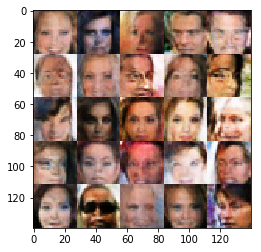

Epoch 1/1... Discriminator Loss: 1.5638... Generator Loss: 0.4332


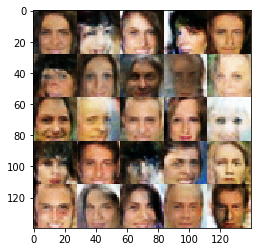

Epoch 1/1... Discriminator Loss: 1.1473... Generator Loss: 0.6890


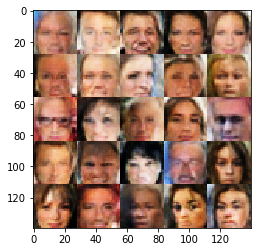

Epoch 1/1... Discriminator Loss: 1.0590... Generator Loss: 0.9114


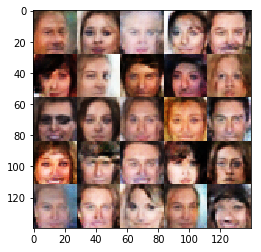

Epoch 1/1... Discriminator Loss: 1.0519... Generator Loss: 0.8564


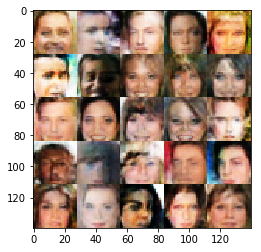

Epoch 1/1... Discriminator Loss: 1.2250... Generator Loss: 0.8448


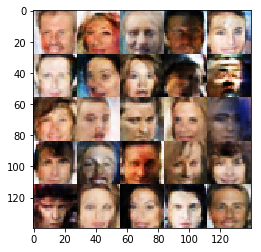

Epoch 1/1... Discriminator Loss: 1.1910... Generator Loss: 0.6695


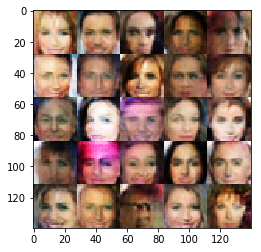

Epoch 1/1... Discriminator Loss: 1.3887... Generator Loss: 0.8251


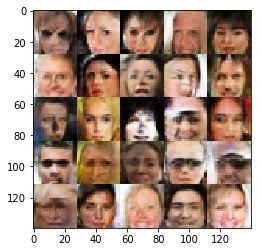

In [19]:
batch_size = 16
z_dim = 100
learning_rate = 0.001
beta1 = 0.4

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### 提交项目
提交本项目前，确保运行所有 cells 后保存该文件。

保存该文件为 "dlnd_face_generation.ipynb"， 并另存为 HTML 格式 "File" -> "Download as"。提交项目时请附带 "helper.py" 和 "problem_unittests.py" 文件。